# Chapter 2. End-to-End Machine Learning Project

In this chapter you will work through an example project end to end, pretending to be a recently hired data scientist at a real estate company. This example is fictitious; the goal is to illustrate the main steps of a machine learning project, not to learn anything about the real estate business. Here are the main steps we will walk through:

1. Look at the big picture.
2. Get the data.
3. Explore and visualize the data to gain insights.
4. Prepare the data for machine learning algorithms.
5. Select a model and train it.
6. Fine-tune your model.
7. Present your solution.
8. Launch, monitor, and maintain your system.

In [1]:
from pathlib import Path

DIRDATA = Path('./datasets/housing')
FILEHOUSING = DIRDATA / "housing.csv"

In [2]:
import pandas as pd
import numpy as np

housing = pd.read_csv(FILEHOUSING)
housing.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20640 entries, 0 to 20639
Data columns (total 10 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   longitude           20640 non-null  float64
 1   latitude            20640 non-null  float64
 2   housing_median_age  20640 non-null  float64
 3   total_rooms         20640 non-null  float64
 4   total_bedrooms      20433 non-null  float64
 5   population          20640 non-null  float64
 6   households          20640 non-null  float64
 7   median_income       20640 non-null  float64
 8   median_house_value  20640 non-null  float64
 9   ocean_proximity     20640 non-null  object 
dtypes: float64(9), object(1)
memory usage: 1.6+ MB


In [3]:
housing.ocean_proximity.value_counts()

<1H OCEAN     9136
INLAND        6551
NEAR OCEAN    2658
NEAR BAY      2290
ISLAND           5
Name: ocean_proximity, dtype: int64

In [4]:
housing.describe()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value
count,20640.000000,20640.000000,20640.000000,20640.000000,20433.000000,20640.000000,20640.000000,20640.000000,20640.000000
mean,-119.569704,35.631861,28.639486,2635.763081,537.870553,1425.476744,499.539680,3.870671,206855.816909
std,2.003532,2.135952,12.585558,2181.615252,421.385070,1132.462122,382.329753,1.899822,115395.615874
min,-124.350000,32.540000,1.000000,2.000000,1.000000,3.000000,1.000000,0.499900,14999.000000
25%,-121.800000,33.930000,18.000000,1447.750000,296.000000,787.000000,280.000000,2.563400,119600.000000
50%,-118.490000,34.260000,29.000000,2127.000000,435.000000,1166.000000,409.000000,3.534800,179700.000000
75%,-118.010000,37.710000,37.000000,3148.000000,647.000000,1725.000000,605.000000,4.743250,264725.000000
max,-114.310000,41.950000,52.000000,39320.000000,6445.000000,35682.000000,6082.000000,15.000100,500001.000000


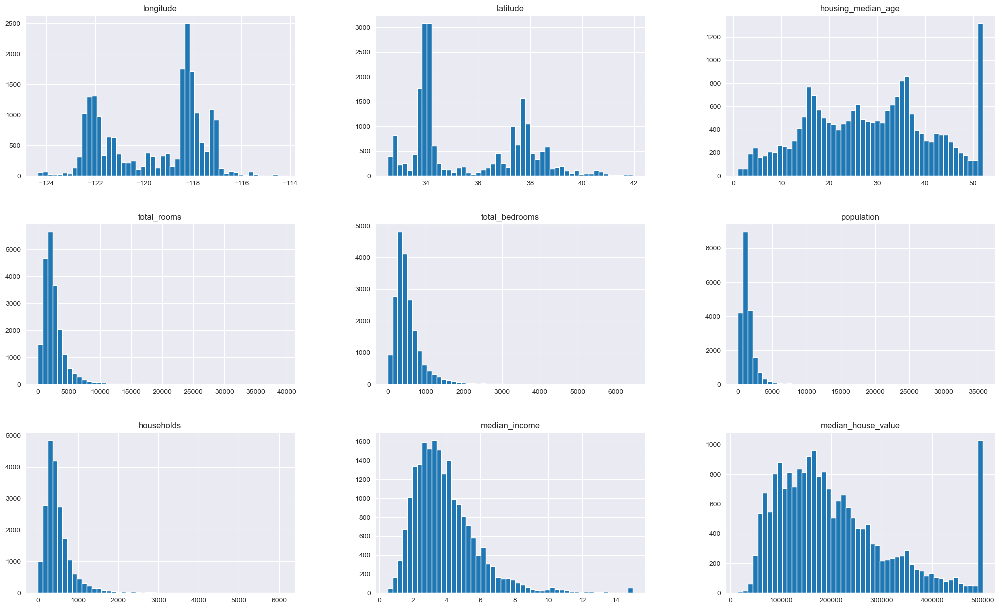

In [5]:
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style("darkgrid")

housing.hist(figsize=(25,15), bins=50);

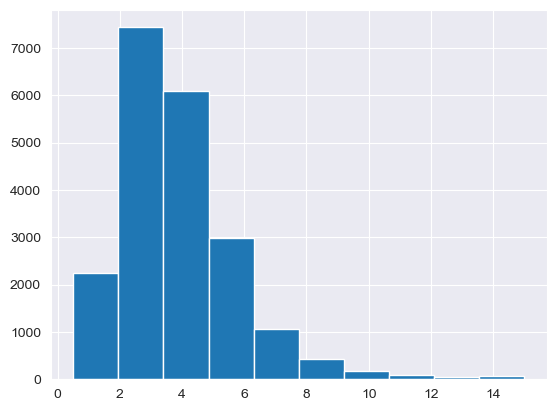

In [6]:
housing['median_income'].hist();

In [7]:
housing['income_cat'] = pd.cut(housing.median_income, 
       bins=np.append(np.linspace(0, 6, 5), np.inf),
       labels = np.arange(1, 6)
      )
housing.income_cat.value_counts() / len(housing)

3    0.350581
2    0.318847
4    0.176308
5    0.114438
1    0.039826
Name: income_cat, dtype: float64

In [8]:
from sklearn.model_selection import train_test_split
train, test = train_test_split(housing, test_size=.2, random_state=42)

train.income_cat.value_counts() / len(train)

3    0.348595
2    0.317466
4    0.178537
5    0.115673
1    0.039729
Name: income_cat, dtype: float64

In [9]:
from sklearn.model_selection import StratifiedShuffleSplit

split = StratifiedShuffleSplit(n_splits=1, test_size=.2, random_state=42)
for train_index, test_index in split.split(housing, housing.income_cat):
    train = housing.loc[train_index]
    test = housing.loc[test_index]
    
train.income_cat.value_counts() / len(train)

3    0.350594
2    0.318859
4    0.176296
5    0.114462
1    0.039789
Name: income_cat, dtype: float64

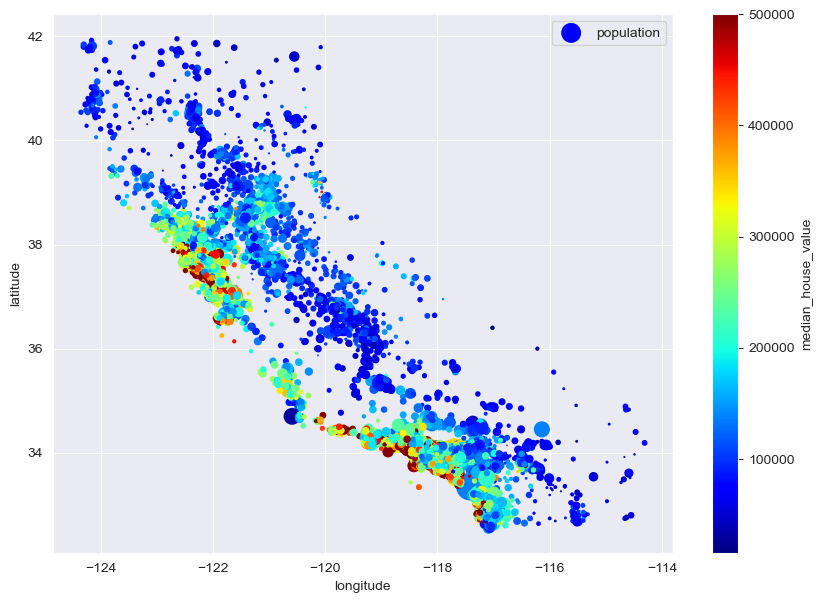

In [29]:
train.plot(kind='scatter', x='longitude', y='latitude', grid=True,
             s=train['population'] / 100, label='population',
             c='median_house_value', cmap='jet', colorbar=True,
             legend=True, sharex=False, figsize=(10, 7))
plt.show()

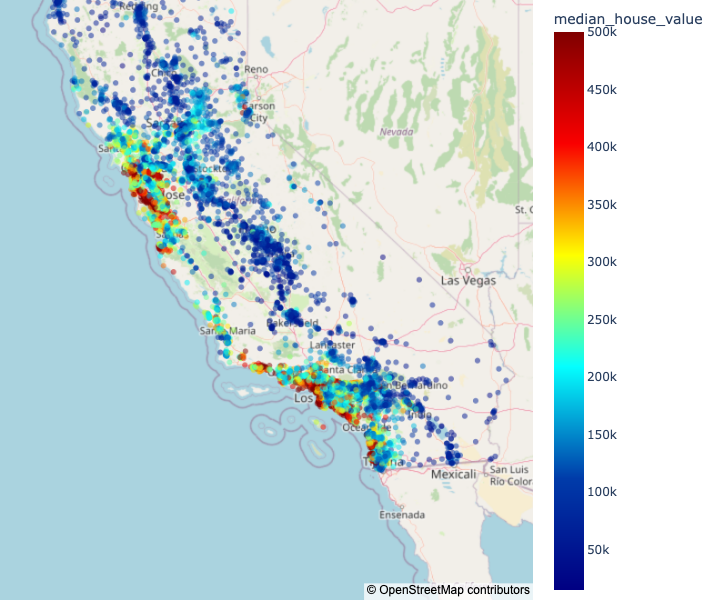

In [27]:
import plotly.express as px
import plotly.express.colors as colors

fig = px.scatter_mapbox(
    train, lat="latitude", lon="longitude",
    opacity=0.5, color="median_house_value", color_continuous_scale=colors.sequential.Jet,
    # hover_name="City", hover_data=["State", "Population"],
    zoom=5, height=300)
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(height=600, width=800, margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

In [23]:
lat, lon, c = housing[["longitude", "latitude", "median_house_value"]].values[0]
lat, lon, c

(-122.23, 37.88, 452600.0)

In [26]:
from matplotlib import cm
from matplotlib.colors import to_hex
import folium

minmaxscaler = lambda X: (X - X.min()) / (X.max() - X.min())
cvalue = minmaxscaler(train.median_house_value) 

m = folium.Map()
for lon, lat, c in np.c_[train[["longitude", "latitude"]].values, cvalue]:
    folium.Circle(
        location=[lat, lon],
        radius=30,
        color=to_hex(cm.jet(c)),
        fill=True,
        opacity=0.5
    ).add_to(m)

bounds = m.get_bounds()
m.fit_bounds(bounds)
m

### Looking for Correlations

In [30]:
corr_matrix = housing.corr()
corr_matrix

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value
longitude,1.000000,-0.924664,-0.108197,0.044568,0.069608,0.099773,0.055310,-0.015176,-0.045967
latitude,-0.924664,1.000000,0.011173,-0.036100,-0.066983,-0.108785,-0.071035,-0.079809,-0.144160
housing_median_age,-0.108197,0.011173,1.000000,-0.361262,-0.320451,-0.296244,-0.302916,-0.119034,0.105623
total_rooms,0.044568,-0.036100,-0.361262,1.000000,0.930380,0.857126,0.918484,0.198050,0.134153
total_bedrooms,0.069608,-0.066983,-0.320451,0.930380,1.000000,0.877747,0.979728,-0.007723,0.049686
population,0.099773,-0.108785,-0.296244,0.857126,0.877747,1.000000,0.907222,0.004834,-0.024650
households,0.055310,-0.071035,-0.302916,0.918484,0.979728,0.907222,1.000000,0.013033,0.065843
median_income,-0.015176,-0.079809,-0.119034,0.198050,-0.007723,0.004834,0.013033,1.000000,0.688075
median_house_value,-0.045967,-0.144160,0.105623,0.134153,0.049686,-0.024650,0.065843,0.688075,1.000000


In [31]:
corr_matrix.median_house_value.sort_values()

latitude             -0.144160
longitude            -0.045967
population           -0.024650
total_bedrooms        0.049686
households            0.065843
housing_median_age    0.105623
total_rooms           0.134153
median_income         0.688075
median_house_value    1.000000
Name: median_house_value, dtype: float64

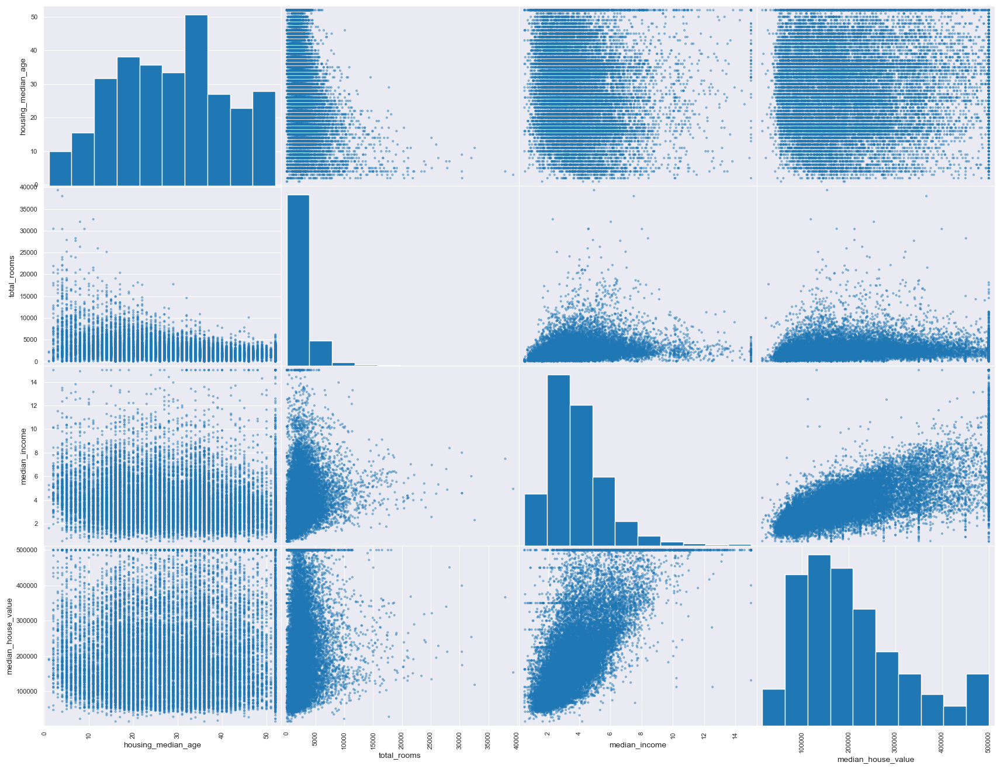

In [32]:
from pandas.plotting import scatter_matrix
attributes = ['housing_median_age', 'total_rooms', 'median_income', 'median_house_value']
scatter_matrix(housing[attributes], figsize=(21, 16));

In [33]:
housing["rooms_per_household"] = housing["total_rooms"]/housing["households"]
housing["bedrooms_per_room"] = housing["total_bedrooms"]/housing["total_rooms"]
housing["population_per_household"]=housing["population"]/housing["households"]

In [34]:
corr_matrix = housing.corr()
corr_matrix.median_house_value.sort_values()

bedrooms_per_room          -0.255880
latitude                   -0.144160
longitude                  -0.045967
population                 -0.024650
population_per_household   -0.023737
total_bedrooms              0.049686
households                  0.065843
housing_median_age          0.105623
total_rooms                 0.134153
rooms_per_household         0.151948
median_income               0.688075
median_house_value          1.000000
Name: median_house_value, dtype: float64

In [35]:
housing = train.drop('median_house_value', axis=1)
housing_labels = train.median_house_value.copy()

### Data Cleaning
#### missing data handling

In [65]:
from sklearn.impute import SimpleImputer

imputer = SimpleImputer(strategy='median')
housing_num = housing.select_dtypes(include=[np.number])
housing_num = imputer.fit_transform(housing_num)

#### Handling Text and Ctegorical Attributes

In [47]:
housing_cat = housing[['ocean_proximity']].copy()
housing_cat.value_counts()

ocean_proximity
<1H OCEAN          7277
INLAND             5262
NEAR OCEAN         2124
NEAR BAY           1847
ISLAND                2
dtype: int64

In [48]:
from sklearn.preprocessing import OneHotEncoder
encoder = OneHotEncoder()
housing_cat_1hot = encoder.fit_transform(housing_cat)
encoder.get_feature_names_out()

array(['ocean_proximity_<1H OCEAN', 'ocean_proximity_INLAND',
       'ocean_proximity_ISLAND', 'ocean_proximity_NEAR BAY',
       'ocean_proximity_NEAR OCEAN'], dtype=object)

In [54]:
df_output = pd.DataFrame(
    data = housing_cat_1hot.toarray(), 
    columns=encoder.get_feature_names_out(),
    index=housing_cat.index
)
df_output.head()


,ocean_proximity_<1H OCEAN,ocean_proximity_INLAND,ocean_proximity_ISLAND,ocean_proximity_NEAR BAY,ocean_proximity_NEAR OCEAN
12655,0.0,1.0,0.0,0.0,0.0
15502,0.0,0.0,0.0,0.0,1.0
2908,0.0,1.0,0.0,0.0,0.0
14053,0.0,0.0,0.0,0.0,1.0
20496,1.0,0.0,0.0,0.0,0.0


### Feature Scaling and Transformation
One of the most important transformations you need to apply to your data is **feature scaling**. With few exceptions, machine learning algorithms don’t perform well when the input numerical attributes have very different scales. This is the case for the housing data: the total number of rooms ranges from about 6 to 39,320, while the median incomes only range from 0 to 15. Without any scaling, most models will be biased toward ignoring the median income and focusing more on the number of rooms.

There are two common ways to get all attributes to have the same scale: `min-max scaling` and `standardization`.

Min-max scaling (many people call this normalization) is the simplest: for each attribute, the values are shifted and rescaled so that they end up ranging from 0 to 1. This is performed by subtracting the min value and dividing by the difference between the min and the max. 

In [88]:
from sklearn.preprocessing import MinMaxScaler
min_max_scaler = MinMaxScaler(feature_range=(-1, 1))
housing_num_min_max_scaled = min_max_scaler.fit_transform(housing_num)

Standardization is different: first it subtracts the mean value (so standardized values have a zero mean), then it divides the result by the standard deviation (so standardized values have a standard deviation equal to 1). Unlike min-max scaling, standardization does not restrict values to a specific range. However, standardization is much less affected by outliers. 

In [89]:
from sklearn.preprocessing import StandardScaler

std_scaler = StandardScaler()
housing_num_std_scaled = std_scaler.fit_transform(housing_num)

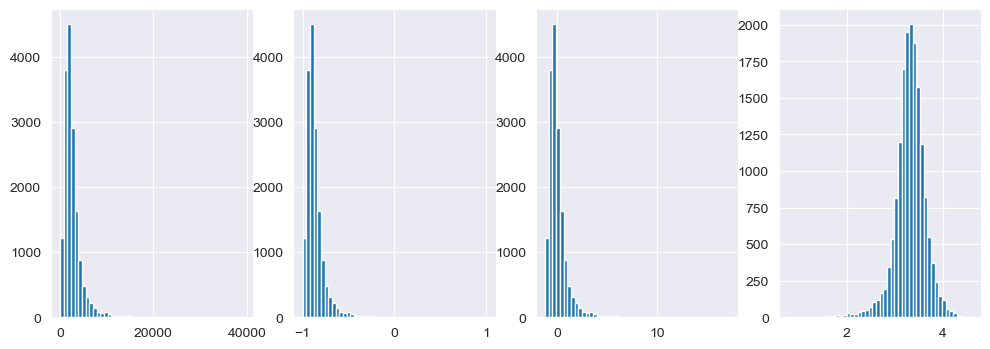

In [102]:
fig, ax = plt.subplots(1, 4, figsize=(12, 4))
ax[0].hist(housing_num[:, 3], bins=50)
ax[1].hist(housing_num_min_max_scaled[:, 3], bins=50)
ax[2].hist(housing_num_std_scaled[:, 3], bins=50)
ax[3].hist(np.log10(housing_num[:, 3]), bins=50)
plt.show()

So far we’ve only looked at the input features, but the target values may also need to be transformed. For example, if the target distribution has a heavy tail, you may choose to replace the target with its logarithm. But if you do, the regression model will now predict the log of the median house value, not the median house value itself. You will need to compute the exponential of the model’s prediction if you want the predicted median house value.